# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## 1. Camera Calibration

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import os

In [2]:
# load camera calibration image
camera_dir = './camera_cal/'
camera_files = [camera_dir + w for w in os.listdir(camera_dir)]

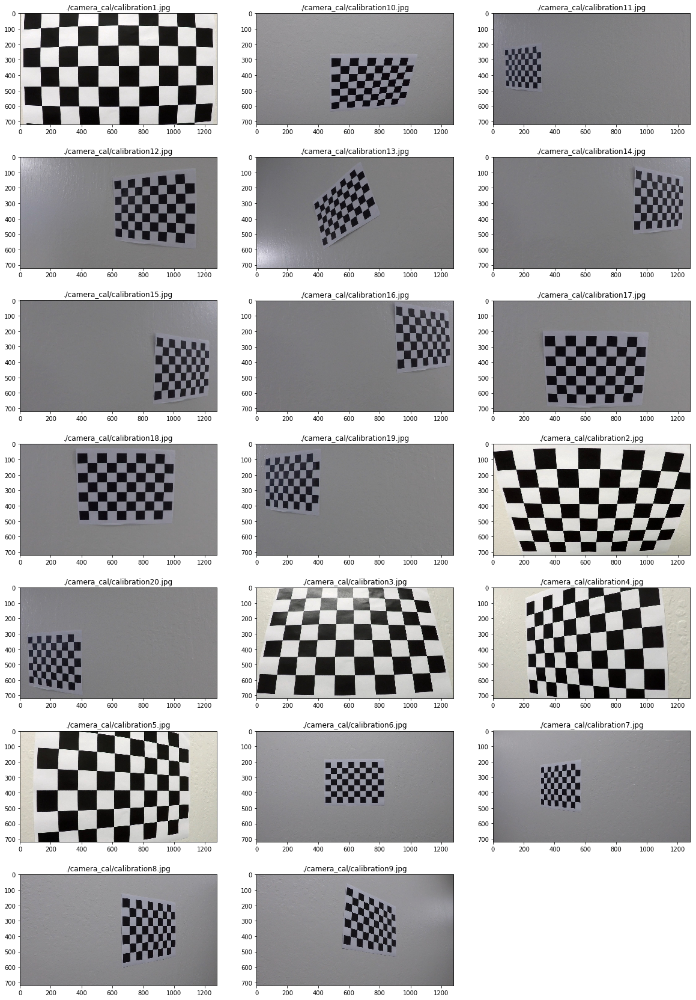

In [3]:
count = 0
#plt.figure()
plt.figure(figsize=(20,30))
for filename in camera_files:
    img = mpimg.imread(filename)
    count +=1
    plt.subplot(7,3,count)
    plt.imshow(img)    
    plt.title(filename)

For each uncalibrated image with a chessboard, we first convert it to a gray image and then find the corners of the chessboard. 

- We first try to find corners among the following sizes according to the order of the list: [(9,6), (9,5), (8,6), (8,5), (7,6), (7,5), (6,6), (5,6)], and will return the corners the first time that cv2.findChessboardCorners is able to find them.
- We then map each of the corners to a point in a rectangular grid. We collect all the corners and the mapped points.
- We then calculate the calibration parameter using cv2.calibrateCamera function.
- We then undistort the first image using the calibrated parameters

In [4]:
def find_corners(img_gray, candidate_sizes):
    for corner_size in candidate_sizes:
        retval, corners = cv2.findChessboardCorners(img_gray, corner_size, None)
        if retval:
            return retval, corners, corner_size
    if not retval:
        return retval, None, None

The located corners are shown below for each image. If corners are not found, then the original image is shown. 

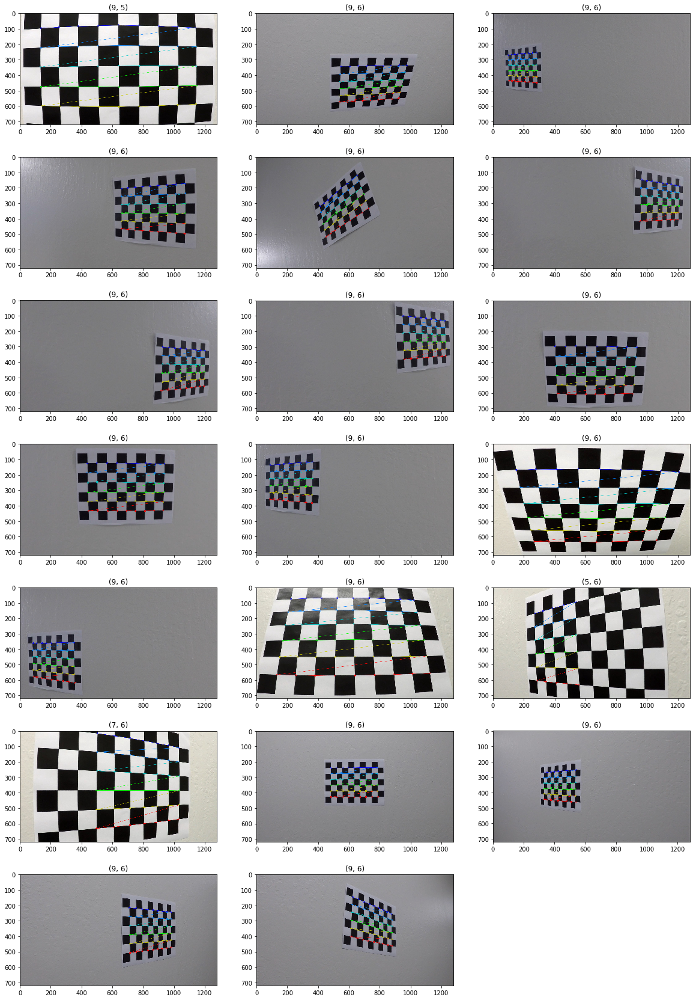

In [5]:
obj_points = []
src_points = []
count = 0
plt.figure(figsize=(20,30))
for filename in camera_files:
    count +=1
    img = mpimg.imread(filename)
    # load image
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # find corners
    retval, corners, corner_size = find_corners(img_gray, [(9,6), (9,5), (8,6), (8,5), (7,6), (7,5), (6,6), (5,6)])
    
    plt.subplot(7,3,count)
    if retval:        
        img_with_lines = cv2.drawChessboardCorners(img.copy(), corner_size, corners, retval)                
        plt.imshow(img_with_lines)
        plt.title(corner_size)
        obj_array = np.concatenate([np.mgrid[0:corner_size[0],0:corner_size[1]].T.reshape(-1,2),
                                    np.zeros((corner_size[0]*corner_size[1],1))], axis=1).astype(np.float32)        
        obj_points.append(obj_array)
        src_points.append(np.squeeze(corners))
    else:
        plt.imshow(img)
            
plt.savefig('./write_up_img/calibration_corners.jpg')

The test image and the undistorted version is shown below:

In [6]:
# return the calibration operation as a function to be used in future steps
def get_undistort_fun(mtx, dist):
    return lambda img: cv2.undistort(img.copy(), mtx, dist, None, mtx)

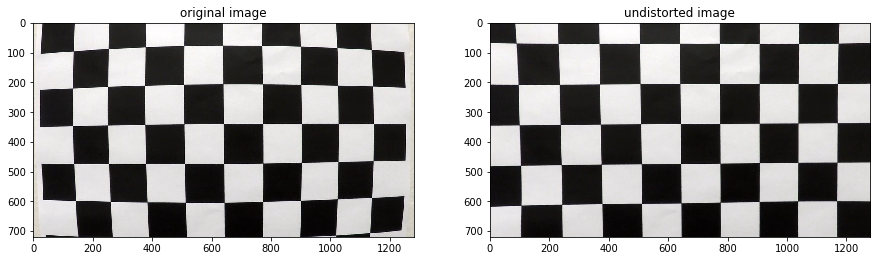

In [7]:
# find calibration parameters    
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    obj_points,
    src_points,
    img_gray.shape[::-1], None, None)

pipline_undistort = get_undistort_fun(mtx, dist)

count = count +1
img = mpimg.imread('./camera_cal/calibration1.jpg')
undistorted = pipline_undistort(img)
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('original image')
plt.subplot(1,2,2)
plt.imshow(undistorted)
plt.title('undistorted image')
plt.savefig('./write_up_img/undistorted_image.jpg')

## 2. Single Image Lane Detection Pipeline

Use an image example, we build the pipeline to process a single image

In [8]:
test_dir = './test_images/'
test_files = os.listdir(test_dir)
filename = 'straight_lines1.jpg'
figsize=(20,8)



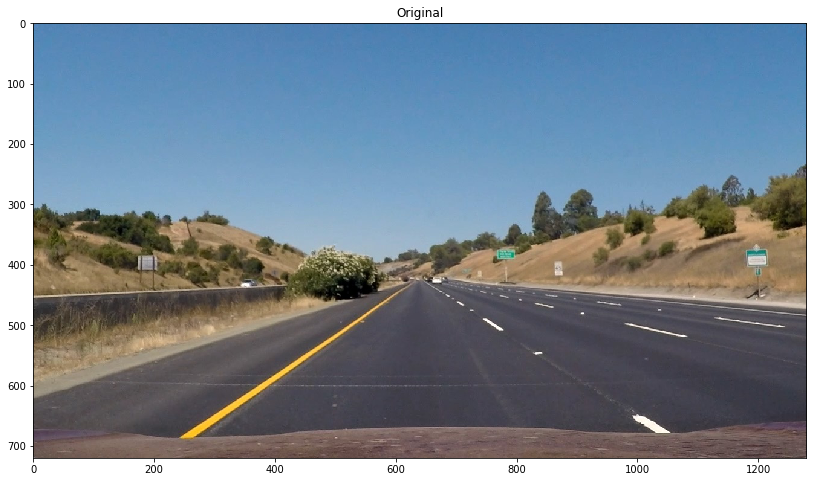

In [9]:
img = mpimg.imread(test_dir+filename)
plt.figure(figsize=figsize)
plt.imshow(img)
plt.title('Original')
plt.savefig('./write_up_img/image_pipeline/original.jpg')

### 2.1 Camera calibration
We apply the above calibration coefficient to undistort the test images:

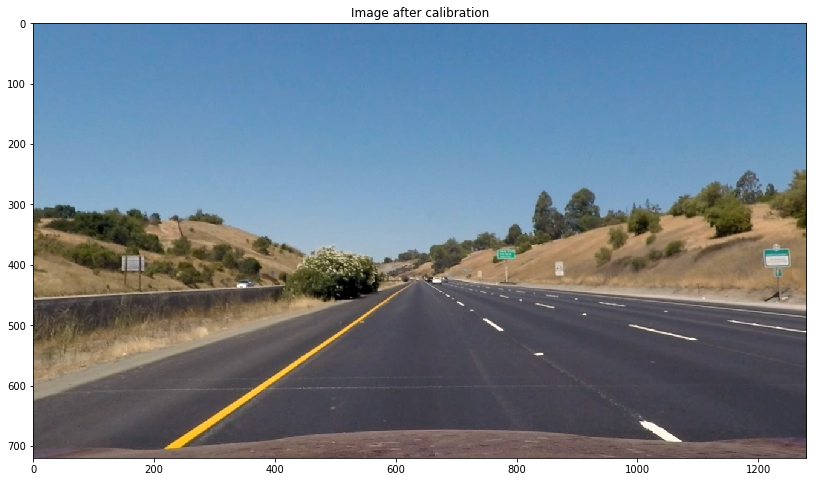

In [10]:
img_undistorted = pipline_undistort(img)
plt.figure(figsize=figsize)
plt.imshow(img_undistorted)
plt.title('Image after calibration')
plt.savefig('./write_up_img/image_pipeline/2_1_after_calibration.jpg')

### 2.2 Edge Detection

In [11]:
def mag_gradient_thresh(img_gray, mag_thresh):    
    # calculate sobel gradient and appy threshold
    sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=15)
    sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=15)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    abs_sobelxy_percentage = abs_sobelxy/np.max(abs_sobelxy)
    # convert to binary image
    mask = np.zeros_like(abs_sobelxy_percentage)
    mask[(abs_sobelxy_percentage>=mag_thresh[0]) & (abs_sobelxy_percentage <= mag_thresh[1])]=1
    return mask

In [12]:
def dir_abs_gradient_thresh(img_gray, dir_thresh, ksize):
    #img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel gradient direction
    sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=ksize)
    sobel_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))    
    # convert to binary image
    mask = np.zeros_like(sobel_dir)
    mask[(sobel_dir>=dir_thresh[0]) & (sobel_dir <= dir_thresh[1])]=1
    return mask

In [13]:
def edge_detection(image, mag_thresh, dir_thresh, ksize, intermediate_image=False):
    """ Detect edge in the color image
    
        We calculate gradient magnitude and direction based on the gray and S channel of the image,
        and use thresholding to obtain the binary image.
    """
    """ Combine graident threshold, direction threshold and S channel threshold to detect desired edges in the image"""
    image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image_S = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]    
    
    image_gray_mag = mag_gradient_thresh(image_gray, mag_thresh)
    image_gray_dir = dir_abs_gradient_thresh(image_gray, dir_thresh,ksize)
    image_gray_binary = np.logical_and(image_gray_mag, image_gray_dir)                         

    image_S_mag = mag_gradient_thresh(image_S, mag_thresh)
    image_S_dir = dir_abs_gradient_thresh(image_S, dir_thresh,ksize)
    image_S_binary = np.logical_and(image_S_mag, image_S_dir) 
  
    image_binary = np.logical_or(image_gray_binary, image_S_binary).astype(np.uint8)*255 
    if intermediate_image:
        return image_binary, image_gray, image_gray_mag, image_gray_dir, image_gray_binary, image_S, image_S_mag, image_S_dir, image_S_binary
    else:
        return image_binary

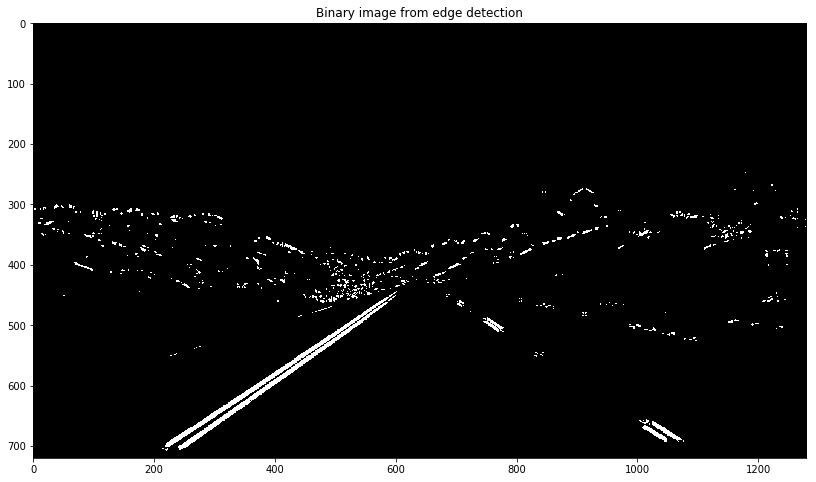

In [14]:
img_binary, image_gray, image_gray_mag, image_gray_dir, image_gray_binary, image_S, image_S_mag, image_S_dir, image_S_binary = edge_detection(img_undistorted, 
                                                                                                                                               mag_thresh=(0.3,1.0),
                                                                                                                                               dir_thresh=(np.pi*45/180, np.pi*75/180),
                                                                                                                                               ksize=15,
                                                                                                                                               intermediate_image=True)
plt.figure(figsize=figsize)
plt.imshow(img_binary, 'gray')
plt.title('Binary image from edge detection')
plt.savefig('./write_up_img/image_pipeline/2_2_edge_detection.png')

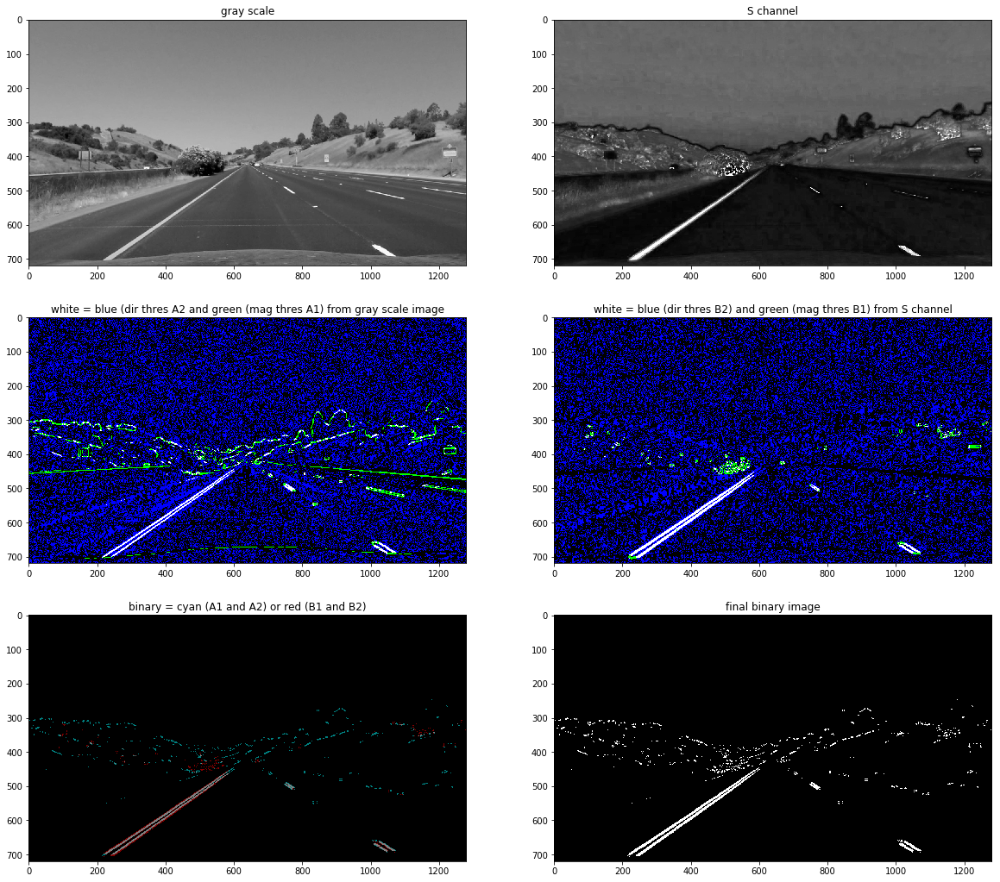

In [15]:
plt.figure(figsize=(20,18))
plt.subplot(3,2,1)
plt.imshow(image_gray, 'gray')
plt.title('gray scale')
plt.subplot(3,2,3)
img_gray_illustration = np.zeros_like(img_undistorted)
img_gray_illustration[:,:,1]=image_gray_mag.astype(np.uint8)*255
img_gray_illustration[:,:,2]=image_gray_dir.astype(np.uint8)*255
img_gray_illustration[:,:,0]=image_gray_binary.astype(np.uint8)*255
plt.imshow(img_gray_illustration)
plt.title('white = blue (dir thres A2 and green (mag thres A1) from gray scale image')
plt.subplot(3,2,2)
plt.imshow(image_S, 'gray')
plt.title('S channel')

plt.subplot(3,2,4)
img_S_illustration = np.zeros_like(img_undistorted)
img_S_illustration[:,:,1]=image_S_mag.astype(np.uint8)*255
img_S_illustration[:,:,2]=image_S_dir.astype(np.uint8)*255
img_S_illustration[:,:,0]=image_S_binary.astype(np.uint8)*255
plt.imshow(img_S_illustration)
plt.title('white = blue (dir thres B2) and green (mag thres B1) from S channel')

plt.subplot(3,2,5)
img_illustration = np.zeros_like(img_undistorted)
img_illustration[:,:,0]=image_S_binary.astype(np.uint8)*128
img_illustration[:,:,1]=image_gray_binary.astype(np.uint8)*128
img_illustration[:,:,2]=image_gray_binary.astype(np.uint8)*128
plt.imshow(img_illustration)
plt.title('binary = cyan (A1 and A2) or red (B1 and B2)')
plt.subplot(3,2,6)
plt.imshow(img_binary, 'gray')
plt.title('final binary image')

plt.savefig('./write_up_img/image_pipeline/2_2_edge_detection_illutration.png')

### 2.3 Perspective Transform
To apply perspective transform, we use cv2. getPerspectiveTransform function by selecting 2 sets of 4 points in the image. 
To obtain these points, we use the basic lane detection algorithm in Project 1 to identify two adjacent lanes in the image and then manually select two horizontal lanes that intersects these two lanes. 
The functions from project 1 are contained in the project1_module.py

#### 2.3.1 Obtain perspective transform

In [16]:
from project1_module import *
def calculat_interaction_from_hough_parameterization(rho1, theta1, rho2, theta2):
    """ Draw lines on a black image that go from boundary to boundary
    """
    intersect = np.linalg.solve(np.array([[np.cos(theta1), np.sin(theta1)], [np.cos(theta2), np.sin(theta2)]]), np.array([rho1,rho2]))
    return intersect
def get_intersection_with_parallel_y_lines(lines, y0, y1):
    p1 = calculat_interaction_from_hough_parameterization(lines[0][0], lines[0][1], y0, math.pi/2).astype(int)
    p2 = calculat_interaction_from_hough_parameterization(lines[1][0], lines[1][1], y0, math.pi/2).astype(int)
    p3 = calculat_interaction_from_hough_parameterization(lines[0][0], lines[0][1], y1, math.pi/2).astype(int)
    p4 = calculat_interaction_from_hough_parameterization(lines[1][0], lines[1][1], y1, math.pi/2).astype(int)
    return [p1,p2,p3,p4]



In [17]:
#lines = process_image(img_binary)
lines= process_image(img_binary, 
                  distance_criterion=10, 
                  rho_weight_cluster=3, 
                  use_heuristic_distance=False, 
                  y_view_percentage=0.6)

corner_points_of_lanes = get_intersection_with_parallel_y_lines(lines, 500, 700)
y0b=100
corner_points_of_lanes = np.stack(corner_points_of_lanes, axis=0)
print('Identified corners \n %s' % str(corner_points_of_lanes))

Identified corners 
 [[ 525  500]
 [ 764  500]
 [ 234  700]
 [1061  700]]


In [18]:
y1=450
delta_x=25
src_points = corner_points_of_lanes.astype(np.float32)
dst_points = np.concatenate([np.stack([src_points[2:4,0],np.ones(2)*y1],axis=1),
                             src_points[2:4,:]], axis=0).astype(np.float32)                               
dst_points[:,0]= dst_points[:,0]+np.array([delta_x, -delta_x, delta_x, -delta_x])
M_perspective_transform = cv2.getPerspectiveTransform(src_points, dst_points)

In [19]:
print('Source point\n %s \n Destination points \n %s' % (str(src_points), str(dst_points)))

Source point
 [[  525.   500.]
 [  764.   500.]
 [  234.   700.]
 [ 1061.   700.]] 
 Destination points 
 [[  259.   450.]
 [ 1036.   450.]
 [  259.   700.]
 [ 1036.   700.]]


In [20]:
img_src_points=img_undistorted.copy()
draw_lines(img_src_points, np.expand_dims(np.stack([np.concatenate([src_points[0],src_points[2]]),
                                                    np.concatenate([src_points[1],src_points[3]]),
                                                    np.concatenate([src_points[0],src_points[1]]),
                                                    np.concatenate([src_points[2],src_points[3]])], axis=0),
                                          axis=0),
           color=[0, 255, 0], thickness=2)
    
img_dst_points = cv2.warpPerspective(img_undistorted, M_perspective_transform, (img_undistorted.shape[1], img_undistorted.shape[0]))
draw_lines(img_dst_points, np.expand_dims(np.stack([np.concatenate([dst_points[0],dst_points[2]]),
                                            np.concatenate([dst_points[1],dst_points[3]]),
                                            np.concatenate([dst_points[0],dst_points[1]]),
                                            np.concatenate([dst_points[2],dst_points[3]])], axis=0),
                                  axis=0),
               color=[0, 255, 0], thickness=2)

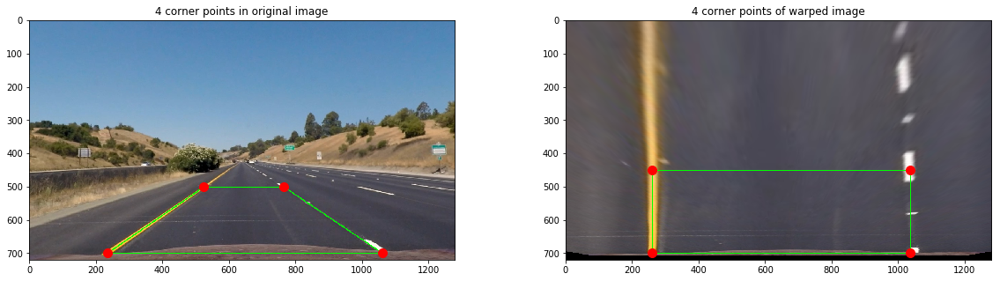

In [21]:
fig, axes = plt.subplots(1,2, figsize=(20,5))
axes[0].imshow(img_src_points)
for jj in range(0, src_points.shape[0]):
    axes[0].plot(src_points[jj,0], src_points[jj,1],'r.', markersize=20)
axes[0].set_title('4 corner points in original image')
axes[1].imshow(img_dst_points)
for jj in range(0, dst_points.shape[0]):
    axes[1].plot(dst_points[jj,0], dst_points[jj,1],'r.', markersize=20)
axes[1].set_title('4 corner points of warped image')
plt.savefig('./write_up_img/image_pipeline/2_3_obtain_perspective_transform.png')

#### 2.3.2 Apply Perspective Transform

In [22]:
img_warped = cv2.warpPerspective(img_undistorted, M_perspective_transform, (img_undistorted.shape[1], img_undistorted.shape[0]))                                 
img_warped_binary = cv2.warpPerspective(img_binary, M_perspective_transform, (img_binary.shape[1], img_binary.shape[0]))  

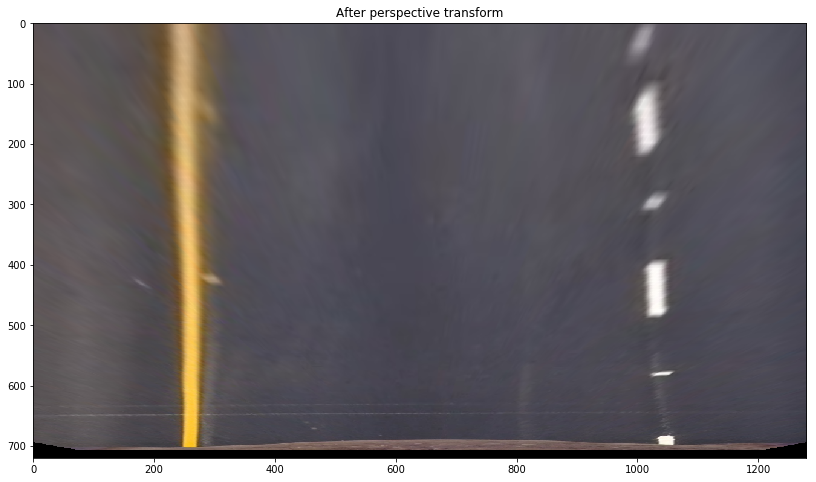

In [23]:
plt.figure(figsize=figsize)
plt.imshow(img_warped)
plt.title('After perspective transform')
plt.savefig('./write_up_img/image_pipeline/2_3_perspective_transform.png')

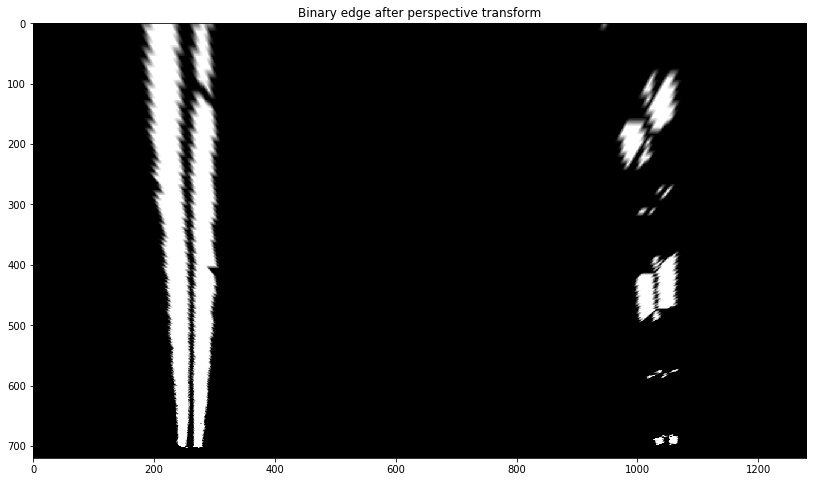

In [24]:
plt.figure(figsize=figsize)
plt.imshow(img_warped_binary, 'gray')
plt.title('Binary edge after perspective transform')
plt.savefig('./write_up_img/image_pipeline/2_3_binary_perspective_transform.png')

## 2.4 Lane Pixel Identification

In [25]:
from scipy import signal    
def find_select_brightest_pixels_per_row(image, threshold):
    max_pixels = np.argmax(image,axis=1)
    max_pixels_value = np.amax(image,axis=1)
    max_pixels_x_select = max_pixels[max_pixels_value >= threshold]
    max_pixels_y_select = np.where(max_pixels_value >= threshold)[0]
    return np.stack([max_pixels_y_select, max_pixels_x_select],axis=1)

def lane_identification(image, threshold=2e4, window_height=21, window_width=61):
    window = np.ones((window_height, window_width))
    convoluted = signal.fftconvolve(image, window, 'same')
    #threshold = 2e4
    lane_pixels_left = find_select_brightest_pixels_per_row(convoluted[:, 0:int(convoluted.shape[1]/2)], threshold)
    lane_pixels_right = find_select_brightest_pixels_per_row(convoluted[:, int(convoluted.shape[1]/2):-1], threshold)
    lane_pixels_right[:,1] = lane_pixels_right[:,1] + int(convoluted.shape[1]/2)     
    return lane_pixels_left, lane_pixels_right

def reject_outlier(lane_pixels, thresh):    
    median_val = np.median(lane_pixels[:,1]) 
    mad = np.median(np.abs(lane_pixels[:,1]-median_val))
    flag = np.abs(lane_pixels[:,1]-median_val)<=thresh*mad
    return lane_pixels[flag,:]

In [26]:
lane_pixels_left, lane_pixels_right= lane_identification(img_warped_binary, threshold=2e4, window_height=41, window_width=71)

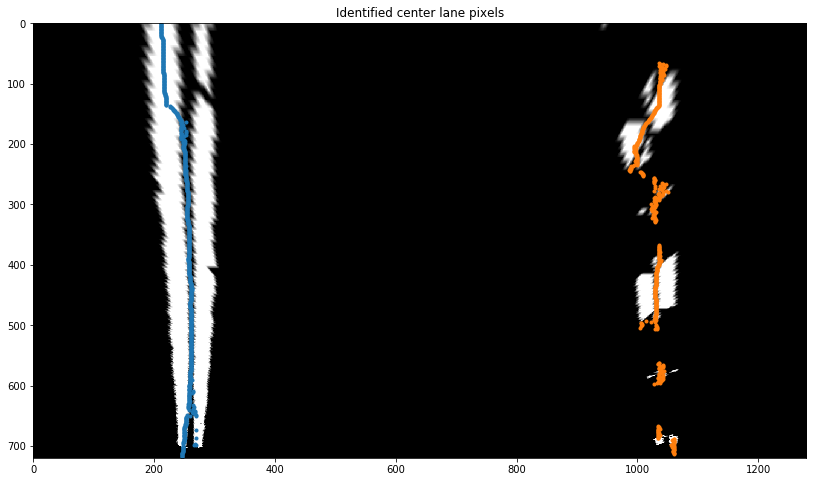

In [27]:
plt.figure(figsize=figsize)
plt.imshow(img_warped_binary, 'gray')
plt.plot(lane_pixels_left[:,1], lane_pixels_left[:,0],'.')
plt.plot(lane_pixels_right[:,1], lane_pixels_right[:,0],'.')
plt.title('Identified center lane pixels')
plt.savefig('./write_up_img/image_pipeline/2_4_lane.png')

In [28]:
lane_pixels_left = reject_outlier(lane_pixels_left,5)
lane_pixels_right = reject_outlier(lane_pixels_right,5)

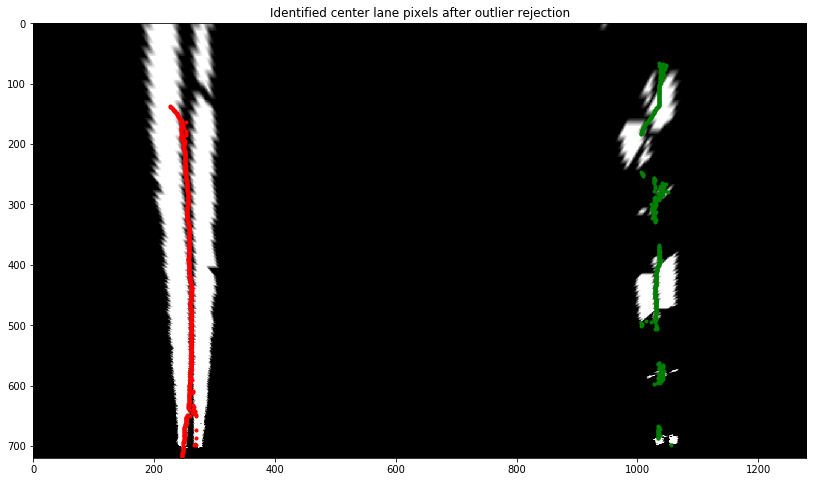

In [29]:
plt.figure(figsize=figsize)
plt.imshow(img_warped_binary, 'gray')
plt.plot(lane_pixels_left[:,1], lane_pixels_left[:,0],'r.')
plt.plot(lane_pixels_right[:,1], lane_pixels_right[:,0],'g.')
plt.title('Identified center lane pixels after outlier rejection')
plt.savefig('./write_up_img/image_pipeline/2_4_lane_reject_outlier.png')

## 2.5 Fit Lane and Calculate Curvature

In [30]:
from sklearn.linear_model import LinearRegression

def get_curvature(lane_pixels, y_car_pos, y_center=350):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    clf = LinearRegression()
    clf.fit(np.concatenate([((lane_pixels[:,0:1]-y_center)*ym_per_pix)**2, (lane_pixels[:,0:1]-y_center)*ym_per_pix], axis=1),
            lane_pixels[:,1]*xm_per_pix)
    coefs = np.concatenate([clf.coef_, [clf.intercept_]])    
    Rcurve_car = (1+(2*(y_car_pos-y_center)*ym_per_pix*coefs[0]+coefs[1])**2)**(3.0/2)/np.abs(2*coefs[0])
    
    y_polyfit = np.arange(0,y_car_pos).astype(np.int32)-y_center
    x_polyfit = (clf.predict(np.stack([(y_polyfit*ym_per_pix)**2, y_polyfit*ym_per_pix],axis=1))/xm_per_pix).astype(np.int32)
    return Rcurve_car, y_polyfit+y_center,x_polyfit, x_polyfit[-1]


def get_curvature_joint_two_lanes(lane_pixels_left, lane_pixels_right, y_car_pos, xm_per_pix, ym_per_pix, image_width, y_center=350):
    # fit lane line and calculate curvature jointly based on two lanes
    
    # prepare data for fitting
    Y_left = np.concatenate([((lane_pixels_left[:,0:1]-y_center)*ym_per_pix)**2,
                             (lane_pixels_left[:,0:1]-y_center)*ym_per_pix,
                             -0.5*np.ones_like(lane_pixels_left[:,0:1])], axis=1)
    x_left = lane_pixels_left[:,1]*xm_per_pix
    Y_right = np.concatenate([((lane_pixels_right[:,0:1]-y_center)*ym_per_pix)**2,
                              (lane_pixels_right[:,0:1]-y_center)*ym_per_pix,
                              0.5*np.ones_like(lane_pixels_right[:,0:1])], axis=1)
    x_right = lane_pixels_right[:,1]*xm_per_pix          
    clf = LinearRegression()
    clf.fit(np.concatenate([Y_left, Y_right],axis=0), np.concatenate([x_left, x_right], axis=0))

    # calculate curvature
    coefs = clf.coef_
    Rcurve_car = (1+(2*(y_car_pos-y_center)*ym_per_pix*coefs[0]+coefs[1])**2)**(3.0/2)/np.abs(2*coefs[0])
    
    y_polyfit = np.arange(0,y_car_pos).astype(np.int32)-y_center
    
    x_left_fit = (
        clf.predict(
            np.stack([(y_polyfit*ym_per_pix)**2, y_polyfit*ym_per_pix, -0.5*np.ones_like(y_polyfit)],axis=1)
        )/xm_per_pix).astype(np.int32)
    x_right_fit = (
        clf.predict(
            np.stack([(y_polyfit*ym_per_pix)**2, y_polyfit*ym_per_pix, 0.5*np.ones_like(y_polyfit)],axis=1)
        )/xm_per_pix).astype(np.int32)    
    x_pos_car = image_width*xm_per_pix/2 - (x_left_fit[-1]+x_right_fit[-1])*xm_per_pix/2
    
    return Rcurve_car, y_polyfit+y_center, x_left_fit, x_right_fit, x_pos_car

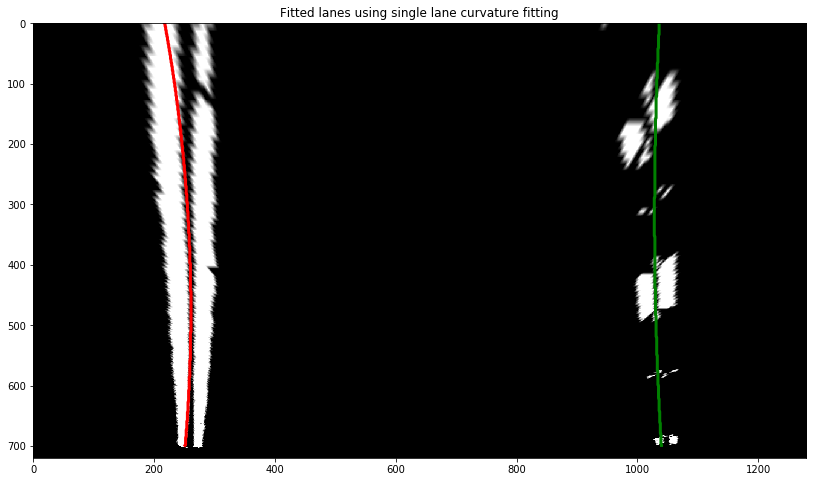

In [31]:
Rleft, y_left, x_left, left_lane_pos = get_curvature(lane_pixels_left, 700, 500)
Rright, y_right, x_right, right_lane_pos = get_curvature(lane_pixels_right, 700, 500)
x_car_pos = img_warped_binary.shape[1]/2 - (left_lane_pos+right_lane_pos)/2
plt.figure(figsize=figsize)
plt.imshow(img_warped_binary, 'gray')
plt.plot(x_left, y_left,'r', linewidth=3)
plt.plot(x_right, y_right,'g', linewidth=3)
plt.title('Fitted lanes using single lane curvature fitting')
plt.savefig('./write_up_img/image_pipeline/2_5_lane_single_fit.png')

In [32]:
ym_per_pix = 30/720
xm_per_pix = 3.7/(dst_points[3,0]-dst_points[2,0]-delta_x*2)
R, y, x_left, x_right, x_pos_car = get_curvature_joint_two_lanes(lane_pixels_left,
                                                                 lane_pixels_right,
                                                                 y_car_pos=700,
                                                                 xm_per_pix=xm_per_pix,
                                                                 ym_per_pix=ym_per_pix,
                                                                 image_width=img_warped_binary.shape[1],
                                                                 y_center=500)


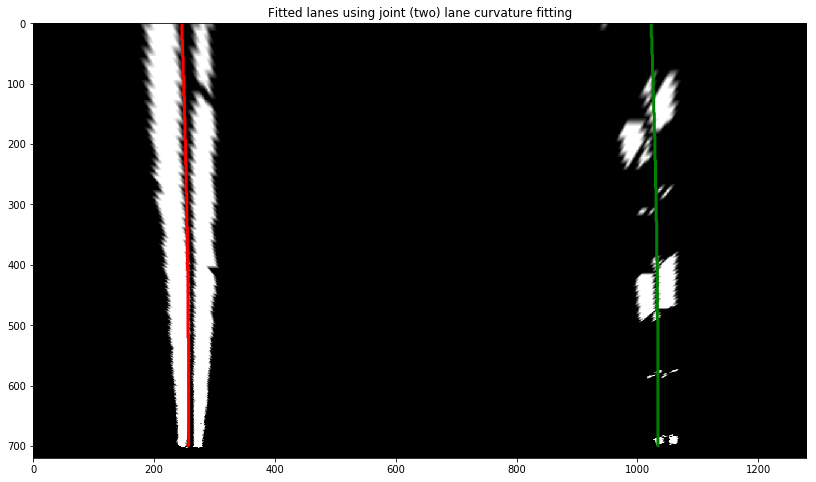

In [33]:
plt.figure(figsize=figsize)
plt.imshow(img_warped_binary, 'gray')
plt.plot(x_left, y,'r', linewidth=3)
plt.plot(x_right, y,'g', linewidth=3)
plt.title('Fitted lanes using joint (two) lane curvature fitting')
plt.savefig('./write_up_img/image_pipeline/2_5_lane_joint_fit.png')

In [34]:
print('Calculate Curvature is %0.0f m' %R)

Calculate Curvature is 5637 m


## 2.6 Mark detected lane

In [35]:
# mask lanes on unwarped image
def mark_unwarped_lane(image, M, x_left, y_left, x_right, y_right, width=5):
    lane_mask_warped = np.zeros_like(image)
    for y in y_left:
        lane_mask_warped[y, (int(x_left[y_left==y])+1):(int(x_right[y_right==y])), 1]=128
        lane_mask_warped[y, int(x_left[y_left==y])-width: int(x_left[y_left==y])+width+1, 0]=128
        lane_mask_warped[y, int(x_right[y_right==y])-width: int(x_right[y_right==y])+width+1, 0]=128    
    lane_mask = cv2.warpPerspective(lane_mask_warped, M, (lane_mask_warped.shape[1], lane_mask_warped.shape[0]), flags=cv2.WARP_INVERSE_MAP)                
    marked_image = image.copy()
    marked_image[lane_mask[:,:,1]==128,1] = 150
    marked_image[lane_mask[:,:,1]==128,0] = (marked_image[lane_mask[:,:,1]==128,0]/2)
    marked_image[lane_mask[:,:,1]==128,2] = (marked_image[lane_mask[:,:,1]==128,2]/2)

    #marked_image[:,:,1] = np.clip(marked_image[:,:,1] + lane_mask[:,:,1], a_min=0, a_max=255)
    marked_image[lane_mask[:,:,0]==128,0] = 255 
    marked_image[lane_mask[:,:,0]==128,1] = 0
    marked_image[lane_mask[:,:,0]==128,1] = 0
    return marked_image

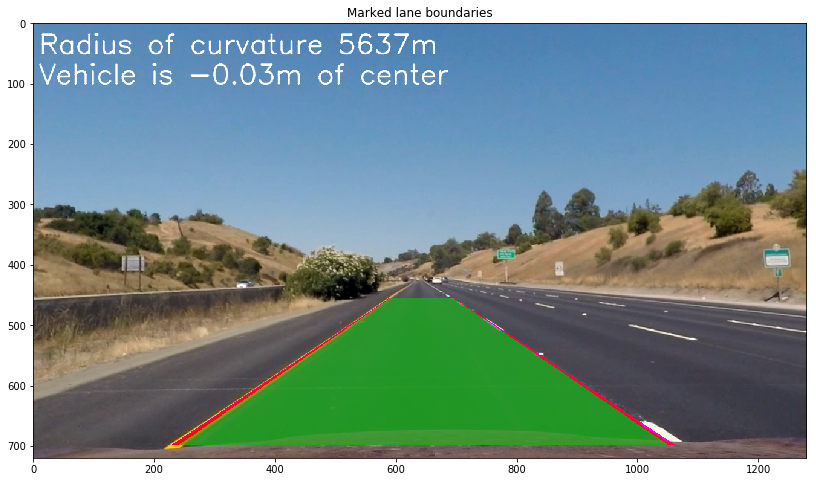

In [36]:
plt.figure(figsize=figsize)
img7 = mark_unwarped_lane(img_undistorted, M_perspective_transform, x_left, y, x_right, y)
font = cv2.FONT_HERSHEY_SIMPLEX
#str(Rleft+Rright)
cv2.putText(img7,'Radius of curvature %0.0fm' % (R),(10,50), font, 1.5,(255,255,255),2,cv2.LINE_AA)
cv2.putText(img7,'Vehicle is %0.2fm of center' % (x_pos_car),(10,100), font, 1.5,(255,255,255),2,cv2.LINE_AA)
plt.imshow(img7)
plt.title('Marked lane boundaries')
plt.savefig('./write_up_img/image_pipeline/2_6_marked_lane_boundary.jpg')

## 3 Apply pipeline to all images

In [37]:
def pipeline(image, output_intermediate_image=False):
    # pipeline to identify and mark lanes
    
    # 1 camera calibration
    image_undistorted = pipline_undistort(image)
    
  
    # 2 edge detection
    image_binary = edge_detection(image_undistorted, 
                                  mag_thresh=(0.3,1),
                                  dir_thresh=(np.pi*45/180, np.pi*75/180),
                                  ksize=15)      
        
    # 3 perspective transform
    if output_intermediate_image:
        image_warped = cv2.warpPerspective(image_undistorted, M_perspective_transform, (image_undistorted.shape[1], image_undistorted.shape[0]))                                    
    image_warped_binary = cv2.warpPerspective(image_binary, M_perspective_transform, (image_binary.shape[1], image_binary.shape[0])) 
    
    # 4 lane center pixel identification
    lane_pixels_left, lane_pixels_right= lane_identification(image_warped_binary)   
    if output_intermediate_image:
        lane_pixels_before_rejection = {}
        lane_pixels_before_rejection['left']=lane_pixels_left
        lane_pixels_before_rejection['right']=lane_pixels_right  
    # 4b reject outlier        
    lane_pixels_left = reject_outlier(lane_pixels_left,5)
    lane_pixels_right = reject_outlier(lane_pixels_right,5)
    if output_intermediate_image:
        lane_pixels = {}
        lane_pixels['left']=lane_pixels_left
        lane_pixels['right']=lane_pixels_right
    # 5 lane fitting and curvature
    ym_per_pix = 30/720
    xm_per_pix = 3.7/(dst_points[3,0]-dst_points[2,0]-delta_x*2)
    
    
    R, y, x_left, x_right, x_pos_car = get_curvature_joint_two_lanes(lane_pixels_left, lane_pixels_right,
                                                                     y_car_pos=700,
                                                                     xm_per_pix=xm_per_pix,
                                                                     ym_per_pix=ym_per_pix,
                                                                     image_width=image_warped_binary.shape[1],
                                                                     y_center=500)   
    y_left = y
    y_right = y
    if output_intermediate_image:
        curvature_par = {}
        curvature_par['x_left'] = x_left
        curvature_par['x_right'] = x_right
        curvature_par['y'] = y
    # 6 mark lanes
    #image_warped_with_lane = cv2.cvtColor(image_warped_binary, cv2.COLOR_GRAY2RGB)  
    image_with_lane_marked = mark_unwarped_lane(image_undistorted, M_perspective_transform, x_left, y_left, x_right, y_right)
    cv2.putText(image_with_lane_marked,'Radius of curvature %0.0fm' % (R),(10,50), font, 1.5,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(image_with_lane_marked,'Vehicle is %0.2fm of center' % (x_pos_car),(10,100), font, 1.5,(255,255,255),2,cv2.LINE_AA)
    if output_intermediate_image:
        return image_with_lane_marked, image_undistorted, image_binary, image_warped_binary, lane_pixels_before_rejection, lane_pixels, curvature_par,   
    else:
        return image_with_lane_marked
    

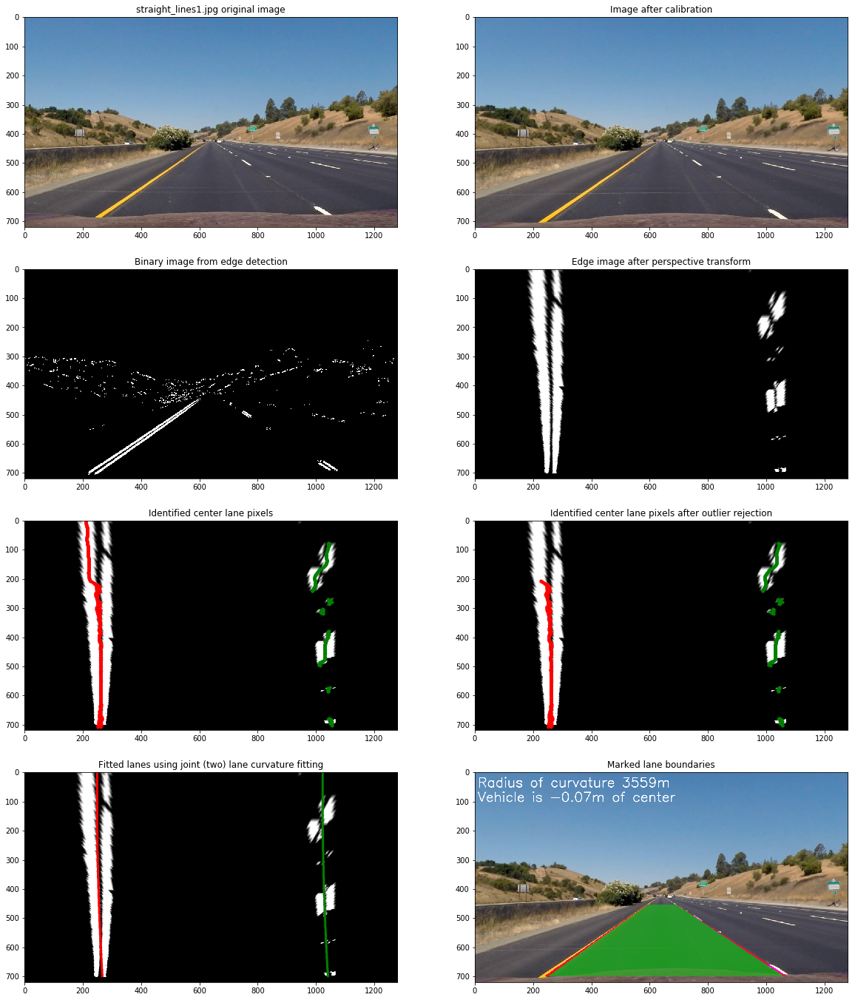

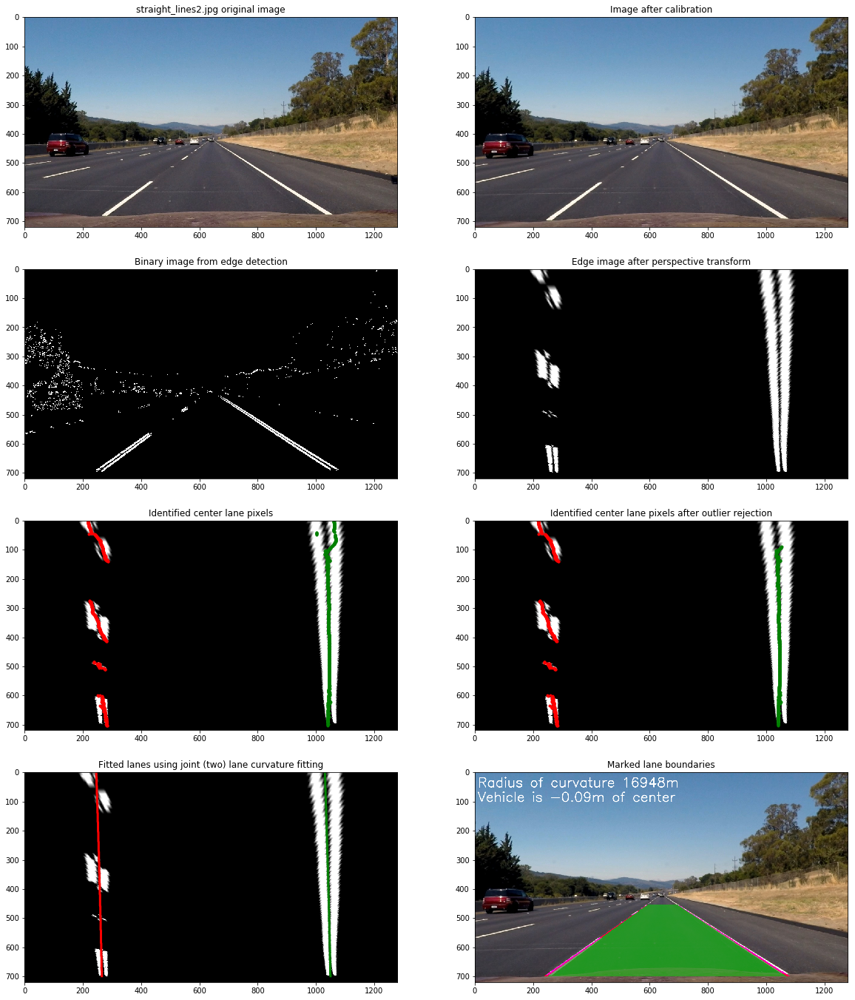

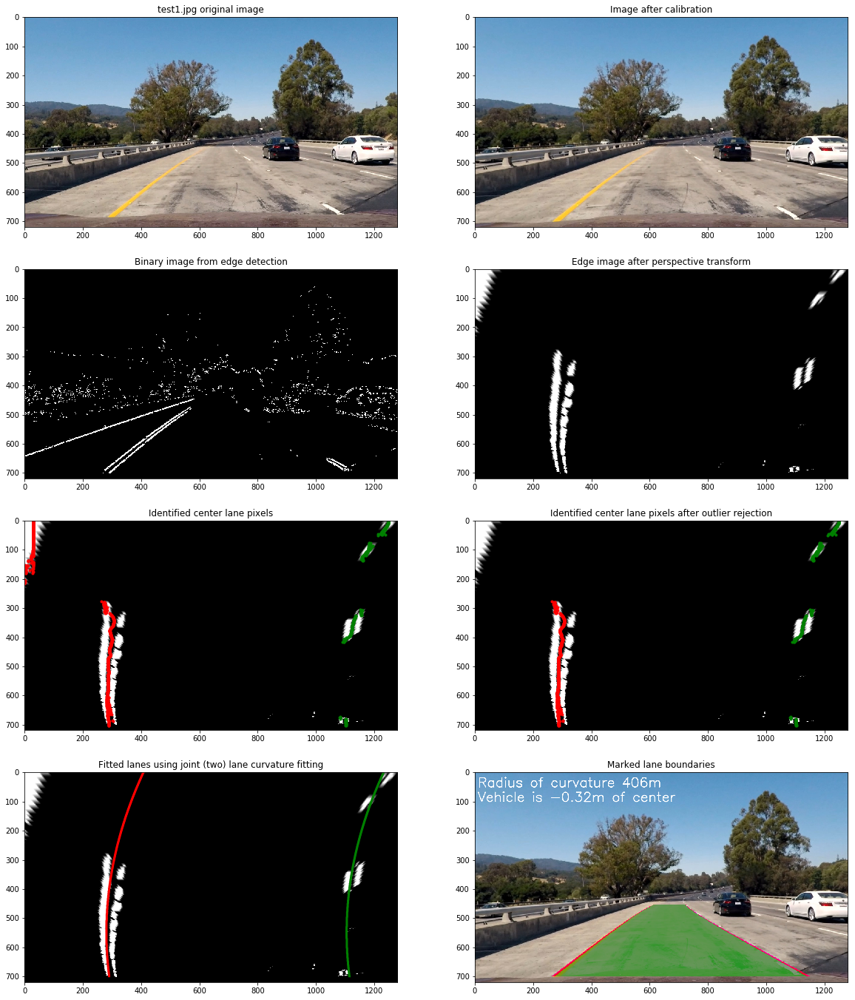

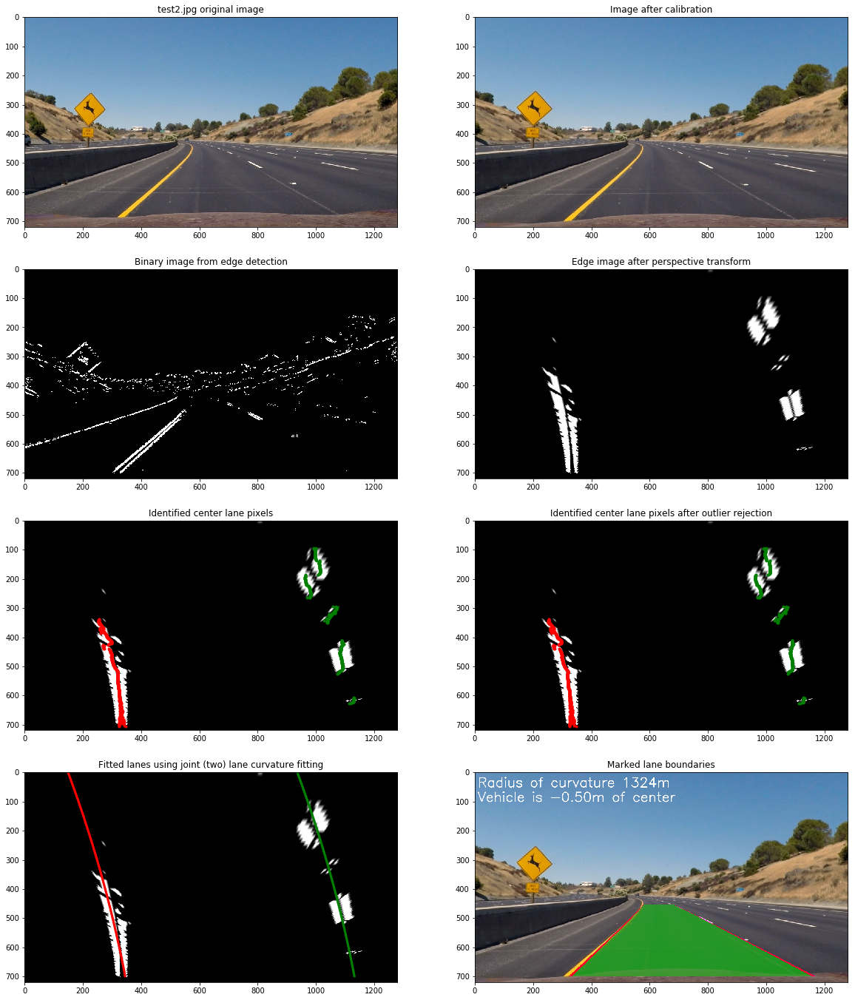

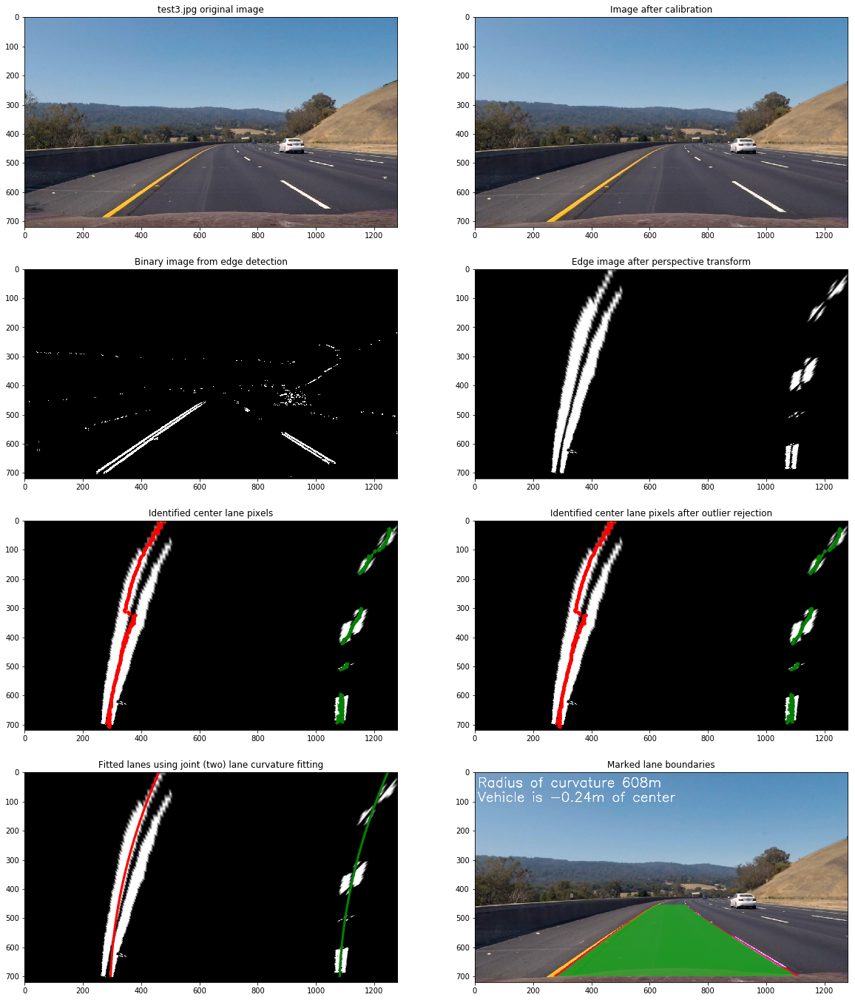

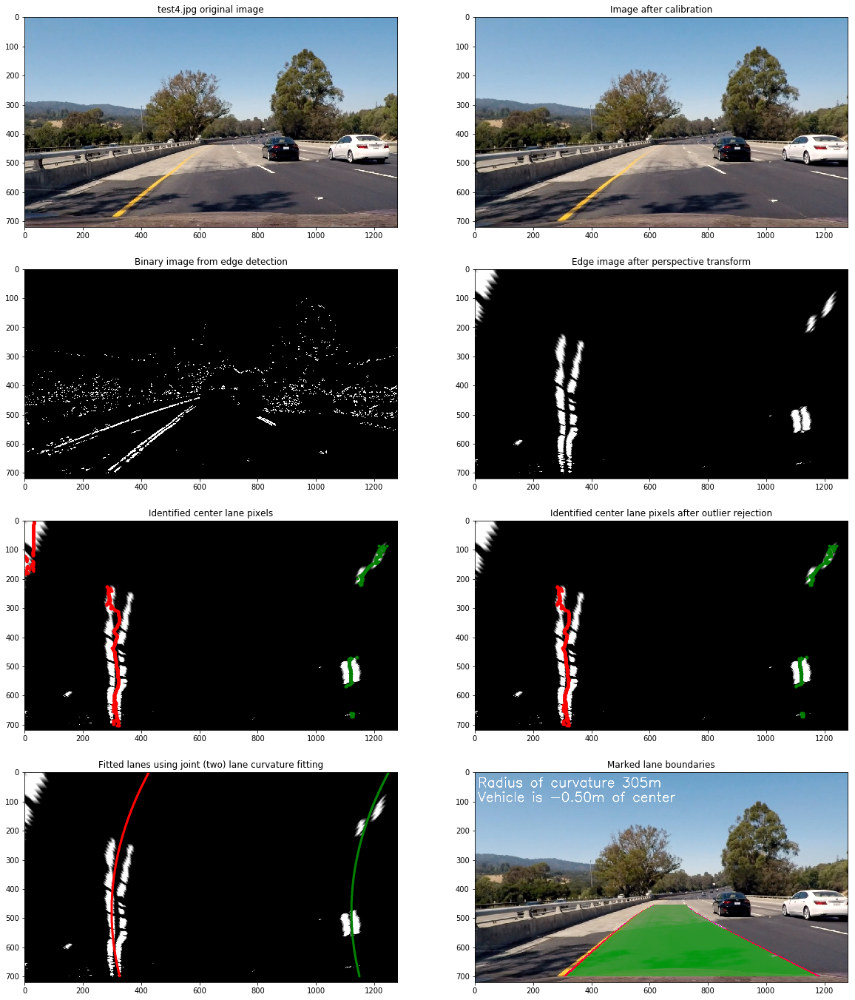

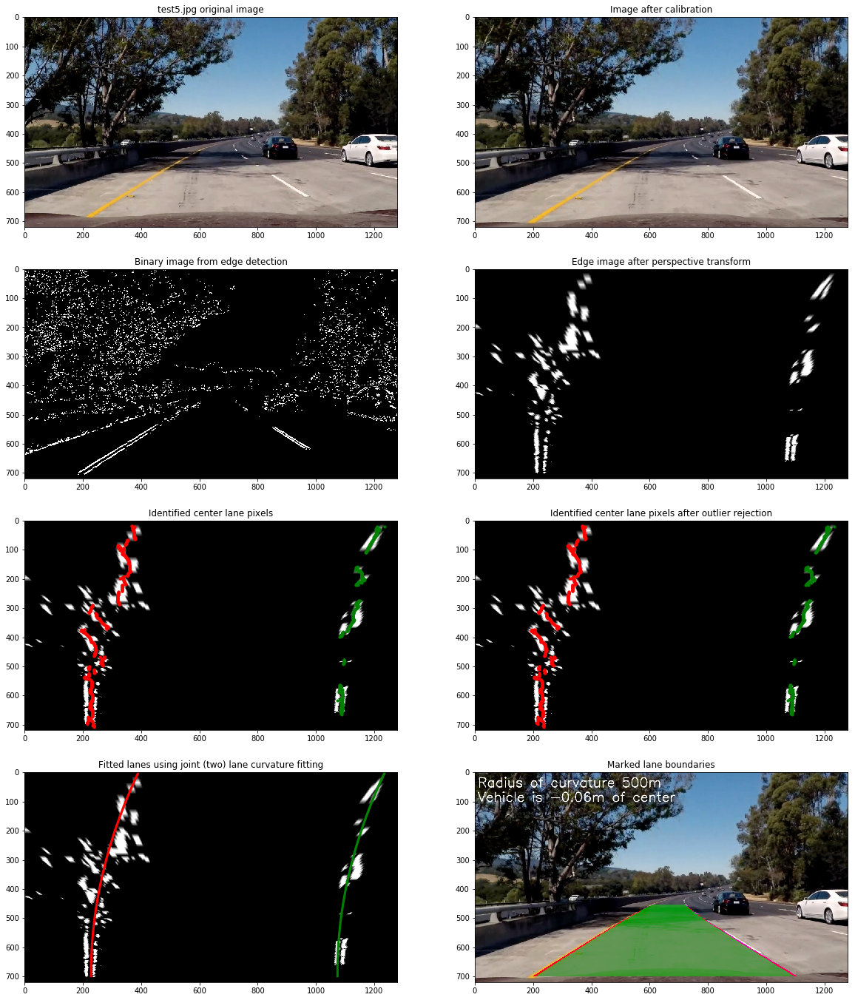

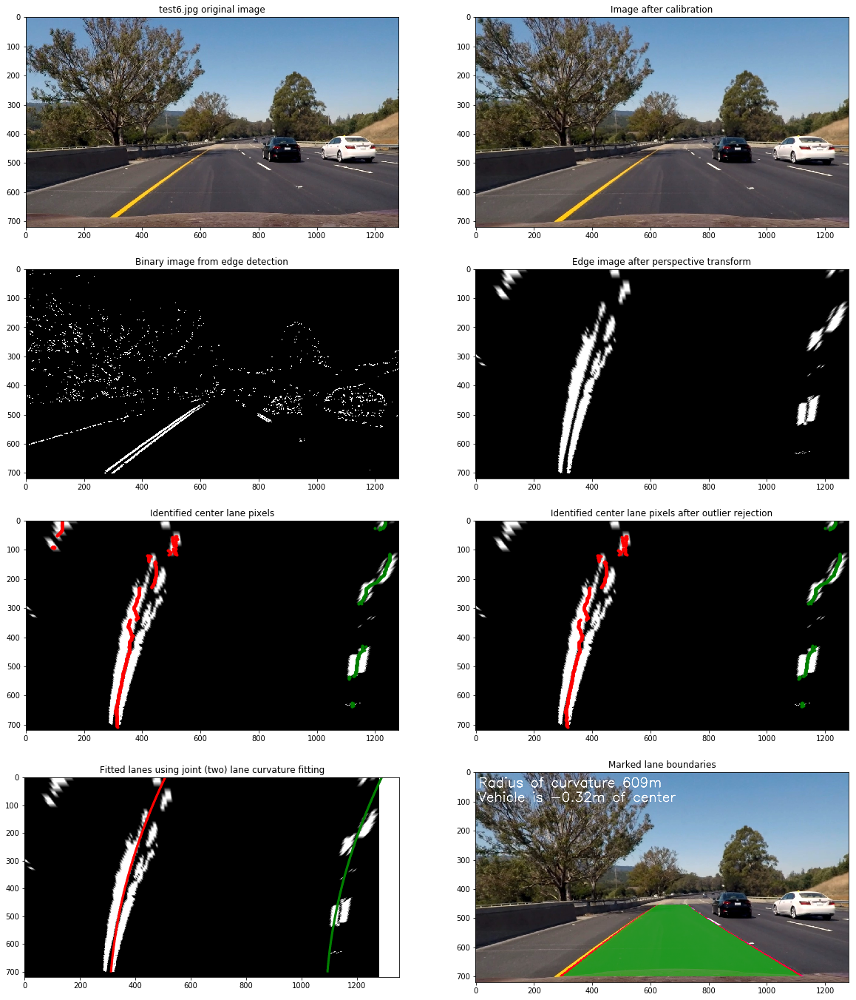

In [38]:
for filename in test_files:
    plt.figure(figsize=(20,24))
    img = mpimg.imread(test_dir + filename)
    img_with_lane_marked, img_undistorted, img_binary, img_warped_binary, lane_pixels_before_rejection, lane_pixels,curvature_par = pipeline(img, output_intermediate_image=True)
    
    plt.subplot(4,2,1)
    plt.imshow(img)
    plt.title(filename + ' original image')
    
    plt.subplot(4,2,2)
    plt.imshow(img_undistorted)
    plt.title('Image after calibration')
    
    plt.subplot(4,2,3)
    plt.imshow(img_binary, 'gray')
    plt.title('Binary image from edge detection')
    
    plt.subplot(4,2,4)
    plt.imshow(img_warped_binary, 'gray')
    plt.title('Edge image after perspective transform')
    
    plt.subplot(4,2,5)
    plt.imshow(img_warped_binary, 'gray')
    plt.plot(lane_pixels_before_rejection['left'][:,1], lane_pixels_before_rejection['left'][:,0],'r.')
    plt.plot(lane_pixels_before_rejection['right'][:,1], lane_pixels_before_rejection['right'][:,0],'g.')
    plt.title('Identified center lane pixels')

    plt.subplot(4,2,6)
    plt.imshow(img_warped_binary, 'gray')
    plt.plot(lane_pixels['left'][:,1], lane_pixels['left'][:,0],'r.')
    plt.plot(lane_pixels['right'][:,1], lane_pixels['right'][:,0],'g.')
    plt.title('Identified center lane pixels after outlier rejection')

    plt.subplot(4,2,7)
    plt.imshow(img_warped_binary, 'gray')
    plt.plot(curvature_par['x_left'], curvature_par['y'],'r', linewidth=3)
    plt.plot(curvature_par['x_right'], curvature_par['y'],'g', linewidth=3)
    plt.title('Fitted lanes using joint (two) lane curvature fitting')

    plt.subplot(4,2,8)
    plt.imshow(img_with_lane_marked)
    plt.title('Marked lane boundaries')
    plt.savefig('./write_up_img/marked_images/'+filename)   

## 4 Pipeline to a video

In [39]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [40]:
def process_image(image):
    return pipeline(image)

In [41]:
output_video = 'output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./project_video.mp4")
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
#%time white_clip.write_videofile(white_output, audio=False)
clip2 = clip1.subclip(0,5)

In [42]:
output_clip = clip1.fl_image(process_image)
output_clip.write_videofile(output_video)

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing audio in project_videoTEMP_MPY_wvf_snd.mp3


100%|████████████████████████████████████| 1112/1112 [00:01<00:00, 1053.04it/s]


[MoviePy] Done.
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [15:57<00:00,  1.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 



In [43]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))